<a href="https://colab.research.google.com/github/skanda07/-ADS-FIRST-LAB-INTERNALS/blob/main/image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1）RGB → CMY**

In [35]:
pip install opencv-python

In [36]:
pip install imutils

In [54]:
from google.colab.patches import cv2_imshow

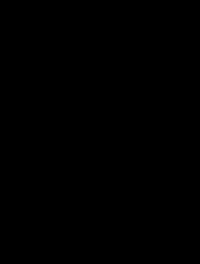

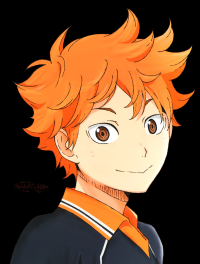

In [61]:

import cv2
import imutils
#from google.colab.patches import cv2_imshow
 
def rgb_cmy(img):
    r, g, b = cv2.split(img)  # split the channels
    # normalization [0,1]
    r = r / 255.0
    g = g / 255.0
    b = b / 255.0
    c = 1 - r
    m = 1 - g
    y = 1 - b
    result = cv2.merge((c, m, y))  # merge the channels
    return result
 
if __name__ == '__main__':
    img = cv2.imread("/content/Haikyuu2.png")
    img_CMY = rgb_cmy(img)
    img_NEW = img_CMY * 255
    cv2.imwrite('/content/imgcmy.png', img_NEW)
    cv2_imshow(imutils.resize(img_CMY, 200))
    cv2_imshow(imutils.resize(img, 200))
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# **3 RGB → HSI**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in double_scalars


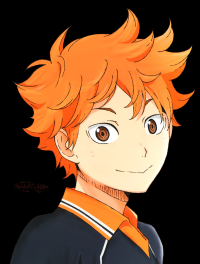

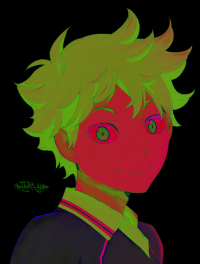

In [62]:

import cv2
import math
import imutils
import numpy as np
 
def rgb_hsi(rgb_Img):
    img_rows = int(rgb_Img.shape[0])
    img_cols = int(rgb_Img.shape[1])
    b, g, r = cv2.split(rgb_Img)
    # normalization[0,1]
    r = r / 255.0
    g = g / 255.0
    b = b / 255.0
    hsi_Img = rgb_Img.copy()
    H, S, I = cv2.split(hsi_Img)
    for i in range(img_rows):
        for j in range(img_cols):
            num = 0.5 * ((r[i, j]-g[i, j])+(r[i, j]-b[i, j]))
            den = np.sqrt((r[i, j]-g[i, j])**2+(r[i, j]-b[i, j])*(g[i, j]-b[i, j]))
            theta = float(np.arccos(num/den))
 
            if den == 0:
                H = 0
            elif b[i, j] <= g[i, j]:
                H = theta
            else:
                H = math.pi - theta
 
            min_RGB = min(min(b[i, j], g[i, j]), r[i, j])
            sum = b[i, j]+g[i, j]+r[i, j]
            if sum == 0:
                S = 0
            else:
                S = 1 - 3*min_RGB/sum
 
            H = H/(math.pi)
            I = sum/3.0
                         # Output HSI image, expand to 255 for easy display, generally H component is between [0,2pi], S and I are between [0,1]
            hsi_Img[i, j, 0] = H*200
            hsi_Img[i, j, 1] = S*200
            hsi_Img[i, j, 2] = I*200
    return hsi_Img
 
if __name__ == '__main__':
    rgb_Img = cv2.imread("/content/Haikyuu2.png")
    hsi_Img = rgb_hsi(rgb_Img)
 
    cv2.imwrite('/content/img_HSI.PNG', hsi_Img)
 
    cv2_imshow(imutils.resize(rgb_Img, 200))
    cv2_imshow(imutils.resize(hsi_Img, 200))
 
    key = cv2.waitKey(0) & 0xFF
    if key == ord('q'):
        cv2.destroyAllWindows()

# **5 RGB → YIQ**

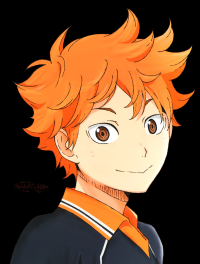

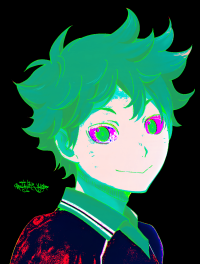

In [63]:
import cv2
import imutils
import numpy as np
 
def rgb_yiq(rgb_Img):
    img_rows = int(rgb_Img.shape[0])
    img_cols = int(rgb_Img.shape[1])
    yiq_image = rgb_Img.copy()
    R, G, B = cv2.split(yiq_image)
 
    for x in range(img_rows):
        for y in range(img_cols):
            right_matrix = np.array([[R[x,y]],
                                     [G[x,y]],
                                     [B[x,y]]])
            left_matrix = np.array([[0.299,0.587,0.114],
                                    [0.596,-0.275,-0.321],
                                    [0.212,-0.528,0.311]])
            matrix = np.dot(left_matrix,right_matrix)
            r = matrix[0][0]
            g = matrix[1][0]
            b = matrix[2][0]
            yiq_image[x, y] = (r, g, b)
    return yiq_image
 
if __name__ == '__main__':
    rgb_Img = cv2.imread("/content/Haikyuu2.png")
    yiq_Img = rgb_yiq(rgb_Img)
    cv2_imshow(imutils.resize(rgb_Img, 200))
    cv2_imshow(imutils.resize(yiq_Img, 200))
 
    cv2.imwrite('/content/img_YIQ1.PNG', yiq_Img)
 
    key = cv2.waitKey(0) & 0xFF
    if key == ord('q'):
        cv2.destroyAllWindows()

# **RGB → YUV**

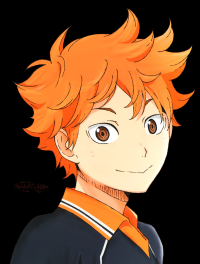

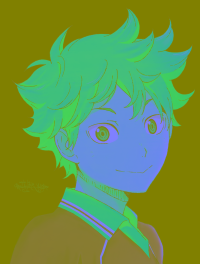

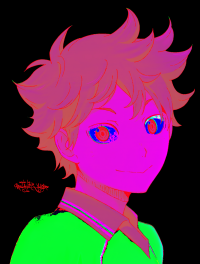

In [64]:
import numpy as np
import cv2 
import imutils
 
 
def rgb_yuv(rgb_img):
    W = np.array([
        [0.299, 0.587, 0.114],
        [-0.148, -0.289, 0.437],
        [0.615, -0.515, -0.100]
    ])
    rgb_Img = rgb_img.copy()
    rgb_Img = rgb_Img.astype(np.float)
    h, w, c = rgb_Img.shape
    for i in range(h):
        for j in range(w):
            rgb_Img[i, j] = np.dot(W, rgb_Img[i, j])
    imc = rgb_Img.astype(np.uint8)
    return imc
 
if __name__ == '__main__':
    img_rgb = cv2.imread('/content/Haikyuu2.png')
    img_yuv1 = cv2.cvtColor(img_rgb, cv.COLOR_RGB2YUV)
    img_yuv2 = rgb_yuv(img_rgb)
 
    cv2.imwrite('/content/img_YUV.PNG', img_yuv1)
    # cv.imwrite('F:/img_YUV_self.PNG', img_yuv2)
 
    cv2_imshow(imutils.resize(img_rgb, 200))
    cv2_imshow(imutils.resize(img_yuv1, 200))
    cv2_imshow(imutils.resize(img_yuv2, 200))
 
    cv.waitKey(0)

# **RGB → YCbCr**

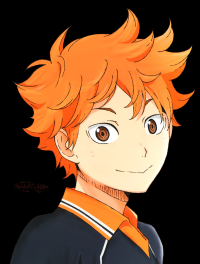

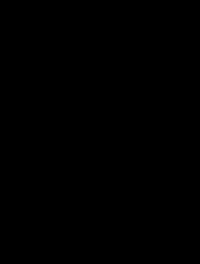

In [66]:

import numpy as np
import cv2 
import imutils
 
def rgb2ycbcr(rgb_image):
    """convert rgb into ycbcr"""
    if len(rgb_image.shape)!=3 or rgb_image.shape[2]!=3:
        raise ValueError("input image is not a rgb image")
    rgb_image = rgb_image.astype(np.float32)
    #1: Create transformation matrix, and offset
    transform_matrix = np.array([[0.257, 0.564, 0.098],
                                 [-0.148, -0.291, 0.439],
                                 [0.439, -0.368, -0.071]])
    shift_matrix = np.array([16, 128, 128])
    ycbcr_image = np.zeros(shape=rgb_image.shape)
    w, h, _ = rgb_image.shape
         #2: Traverse the three channels of each pixel to transform
    for i in range(w):
        for j in range(h):
            ycbcr_image[i, j, :] = np.dot(transform_matrix, rgb_image[i, j, :]) + shift_matrix
    return ycbcr_image
 
if __name__ == '__main__':
    img_rgb = cv2.imread('/content/Haikyuu2.png')
    img_ycbcr = rgb2ycbcr(img_rgb)
    img_NEW = img_ycbcr / 255
 
    cv2.imwrite('F:/img_YCbCr.PNG', img_ycbcr)
 
    cv2_imshow(imutils.resize(img_rgb, 200))
    cv2_imshow(imutils.resize(img_NEW, 200))
 
    cv.waitKey(0)

# **RGB-> HSV**

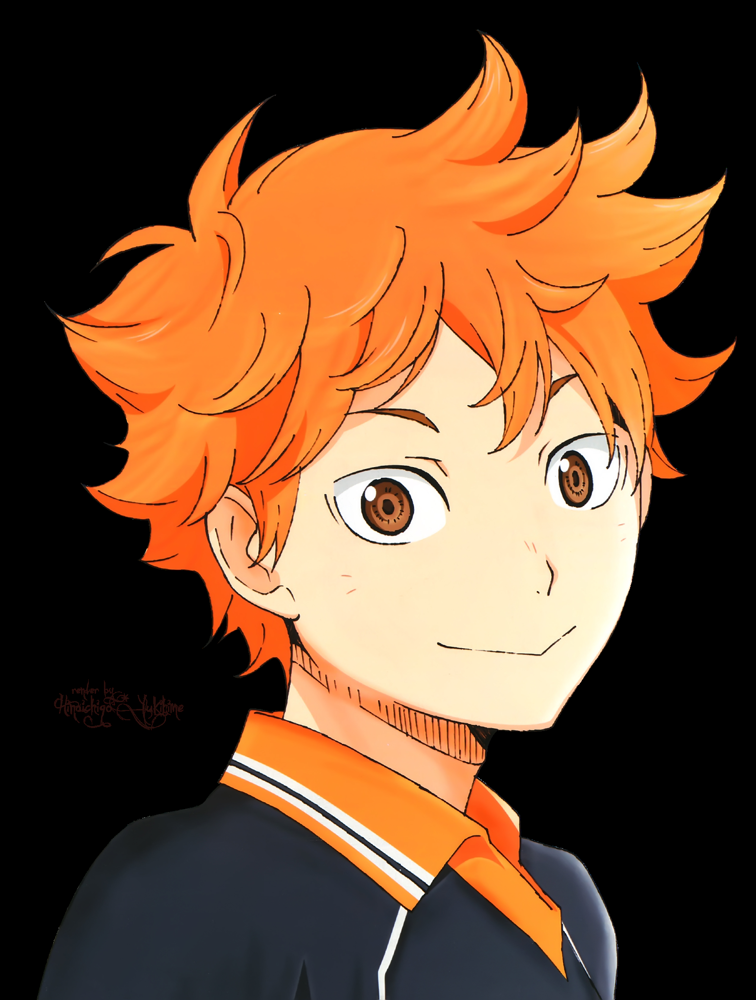

(2048, 1549, 3)


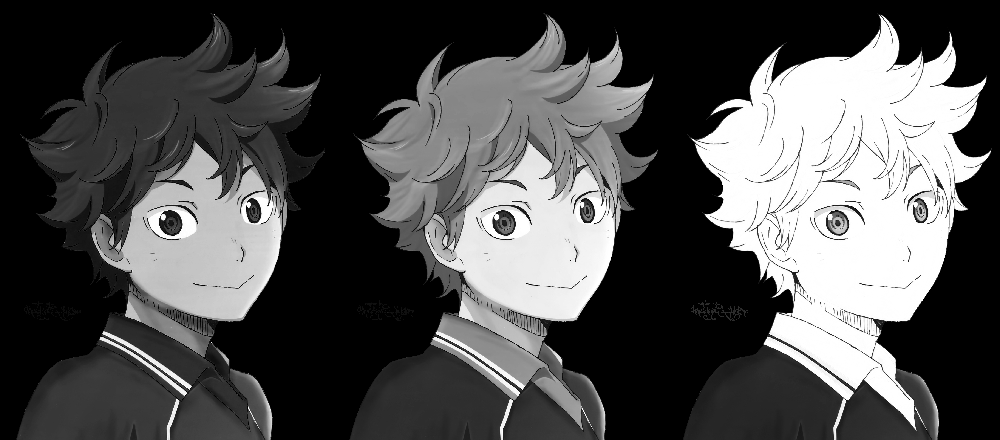

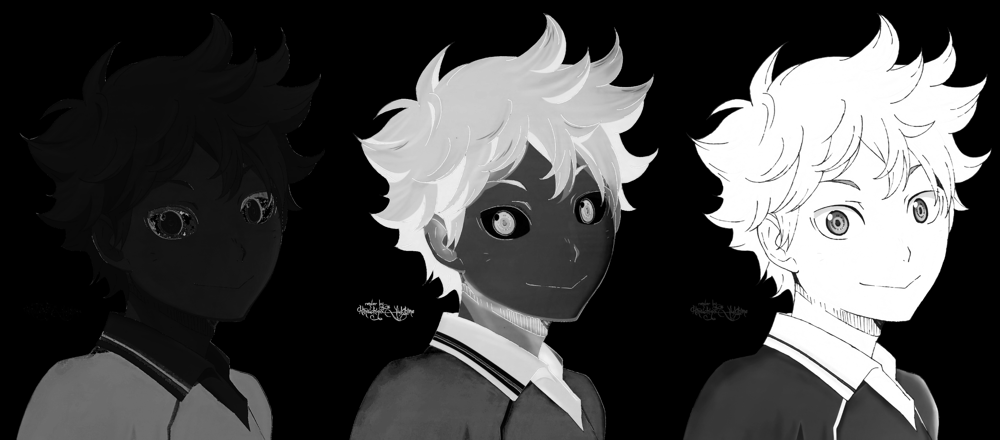

-1

In [71]:

import numpy as np
import cv2
color = cv2.imread("/content/Haikyuu2.png", 1)
cv2_imshow(color)
#cv2.moveWindow("Image",0,0)
print(color.shape)
height,width,channels = color.shape
b,g,r = cv2.split(color)
rgb_split = np.empty([height,width*3,3],'uint8')
rgb_split[:, 0:width] = cv2.merge([b,b,b])
rgb_split[:, width:width*2] = cv2.merge([g,g,g])
rgb_split[:, width*2:width*3] = cv2.merge([r,r,r])
cv2_imshow(rgb_split)
#cv2.moveWindow("Channels",0,height)
hsv = cv2.cvtColor(color, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(hsv)
hsv_split = np.concatenate((h,s,v),axis=1)
cv2_imshow(hsv_split)
cv2.waitKey(0)

**An HSV is another type of color space in which H stands for Hue, S stands for Saturation and V stands for Value.**

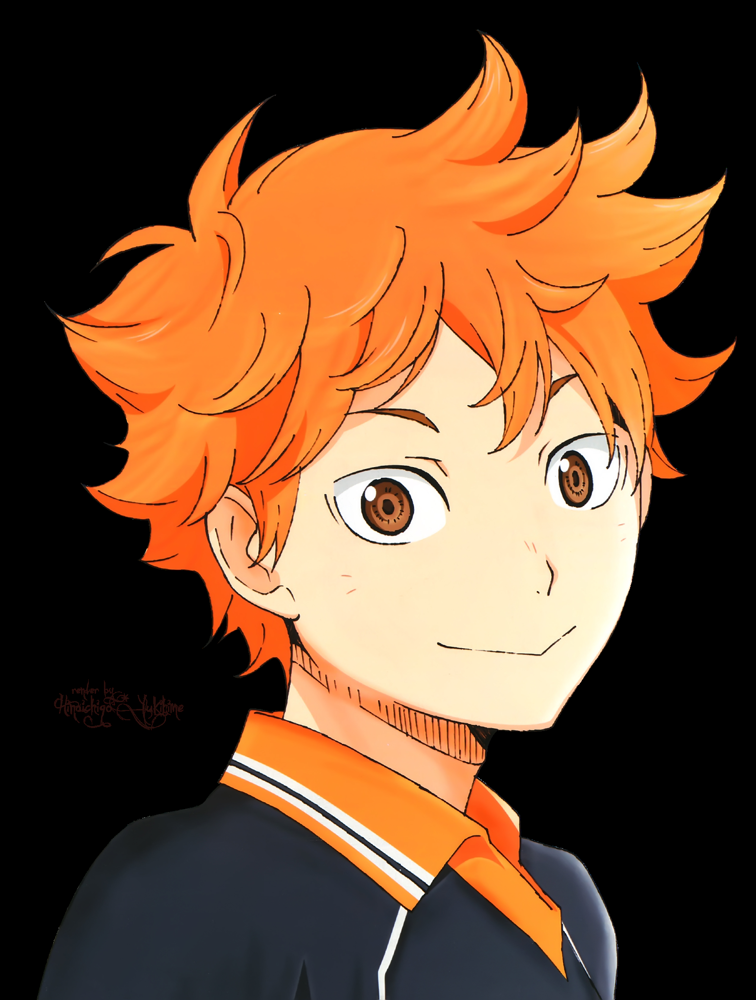

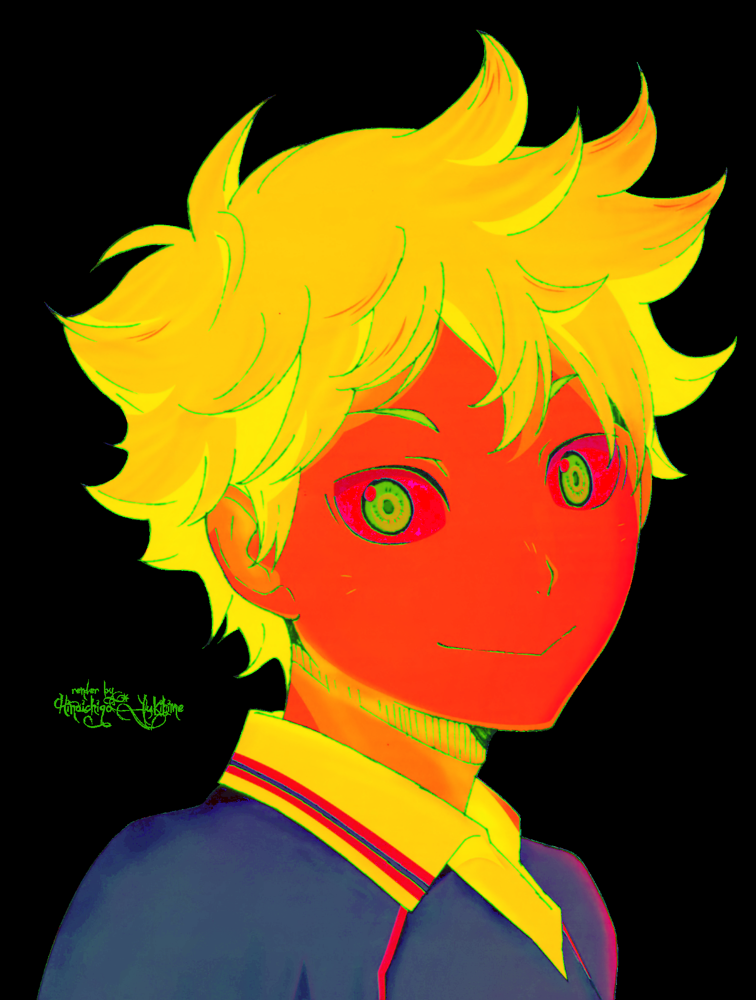

In [72]:
import cv2

# read an image using imread() function of cv2
# we have to  pass only the path of the image
img = cv2.imread( '/content/Haikyuu2.png')

# displaying the image using imshow() function of cv2
# In this : 1st argument is name of the frame
# 2nd argument is the image matrix
cv2_imshow(img)

# converting the colourfull image into HSV format image
# using cv2.COLOR_BGR2HSV argument of
# the cvtColor() function of cv2
# in this :
# ist argument is the image matrix
# 2nd argument is the attribute
HSV_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

# displaying the Hsv format image
cv2_imshow(HSV_img)